# Demo Run

In [1]:
%load_ext autoreload
%autoreload 2
# # this may cause DisentanglementManager to reimported, losing all the data e.g. configurations.

In [2]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DeJavu Serif"
plt.rcParams["font.serif"] = ["Times New Roman"]

In [3]:
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import numpy as np
import scanpy as sc
import numpy as np

sys.path.append("/Users/kemalinecik/git_nosync/tardis")
import tardis
tardis.config = tardis.config_local

sc.settings.verbosity = 3

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
adata

The directory '{'relative_to': 'storage_directory', 'path': '_temporary'}' for key 'temp' is not a writable absolute directory.


ValueError: The directory '{'relative_to': 'storage_directory', 'path': '_temporary'}' for key 'temp' is not a writable absolute directory.

In [5]:
adata.X = adata.layers["counts"].copy()
del adata.layers
gc.collect()

32

In [6]:
adata.obs["dose_val_log"] = np.log10(adata.obs["dose_val"] + 1e-8)
adata.obs

,sample,size_factor,n.umi,hash_umis,pval,qval,top_to_second_best_ratio,top_oligo,drug,dose,...,product_dose,louvain,dose_val,cell_type,drug_dose_name,cov_drug_dose_name,condition,control,split,dose_val_log
index,,,,,,,,,,,,,,,,,,,,,
A01_A01_RT_390,sciChem18,0.849329,3430.0,16.0,1.404159e-140,3.650813e-139,15.005464,Nutlin_0.5_AB02,Nutlin,0.5,...,Nutlin 0.5,1,0.005,A549,Nutlin_0.005,A549_Nutlin_0.005,Nutlin,0,test,-2.301029e+00
A01_A01_RT_396,sciChem18,1.612486,6512.0,35.0,0.000000e+00,0.000000e+00,2.379168,Dex_50_BC10,Dex,50.0,...,Dex 50.0,7,0.500,A549,Dex_0.5,A549_Dex_0.5,Dex,0,ood,-3.010300e-01
A01_A01_RT_400,sciChem18,0.786681,3177.0,23.0,3.035262e-222,9.409311e-221,20.920000,Nutlin_0_AB04,Vehicle,0.0,...,Vehicle 0.0,3,1.000,A549,Vehicle_1.0,A549_Vehicle_1.0,Vehicle,1,train,4.342945e-09
A01_A01_RT_401,sciChem18,1.258641,5083.0,69.0,0.000000e+00,0.000000e+00,1.892483,BMS_0.1_BH11,BMS,0.1,...,BMS 0.1,1,0.001,A549,BMS_0.001,A549_BMS_0.001,BMS,0,train,-2.999996e+00
A01_A01_RT_402,sciChem18,3.432476,13862.0,104.0,0.000000e+00,0.000000e+00,1.262781,Nutlin_10_AA03,Nutlin,10.0,...,Nutlin 10.0,3,0.100,A549,Nutlin_0.1,A549_Nutlin_0.1,Nutlin,0,test,-1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
H12_B02_RT_745,sciChem18,0.731463,2954.0,63.0,0.000000e+00,0.000000e+00,63.363772,Nutlin_1_AB01,Nutlin,1.0,...,Nutlin 1.0,3,0.010,A549,Nutlin_0.01,A549_Nutlin_0.01,Nutlin,0,train,-2.000000e+00
H12_B02_RT_750,sciChem18,0.611616,2470.0,116.0,0.000000e+00,0.000000e+00,143.054022,Nutlin_50_AA10,Nutlin,50.0,...,Nutlin 50.0,5,0.500,A549,Nutlin_0.5,A549_Nutlin_0.5,Nutlin,0,ood,-3.010300e-01
H12_B02_RT_752,sciChem18,3.208135,12956.0,63.0,0.000000e+00,0.000000e+00,4.731265,BMS_0.1_BG07,BMS,0.1,...,BMS 0.1,3,0.001,A549,BMS_0.001,A549_BMS_0.001,BMS,0,train,-2.999996e+00


In [7]:
adata.obs["sample"].unique()

['sciChem18']
Categories (1, object): ['sciChem18']

## Train

In [8]:
warmup_epoch_range = [10, 40]
# _, n_epochs_kl_warmup = warmup_epoch_range
n_epochs_kl_warmup = 400

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "dose_val_log",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = True,
                weight = 100,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = 10, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "condition",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = True,
                weight = 100,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = 10, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=36, 
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.1,
    include_auxillary_loss = True
)

train_params = dict(
    max_epochs=2000,
    train_size=0.8,
    batch_size=512,
    check_val_every_n_epoch=10,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=True,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-3,
        weight_decay=1e-6,
        # optimizer="AdamW"
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations
)

tardis.MyModel.setup_anndata(adata, **dataset_params)

# tardis.MyModel.setup_wandb(
#     wandb_configurations=tardis.config.wandb,
#     hyperparams=dict(
#         model_params=model_params,
#         train_params=train_params,
#         dataset_params=dataset_params,
#     )
# )

vae = tardis.MyModel(adata, **model_params)
with warnings.catch_warnings():
    warnings.filterwarnings("ignore", category=DeprecationWarning)
    vae.train(**train_params)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
/Users/kemalinecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/pytorch/trainer/setup.py:201: UserWarning: MPS available but not used. Set `accelerator` and `devices` using `Trainer(accelerator='mps', devices=1)`.
  rank_zero_warn(
/Users/kemalinecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Epoch 1/2000:   0%|          | 0/2000 [00:00<?, ?it/s]

/Users/kemalinecik/git_nosync/tardis/tardis/_counteractivegenerator.py:231: UserWarning: Possible group definition indices are calculated for `dose_val_log` for `training` set. Number of elements in each group: 1597,1408,1742,1415,1526,1423,2738
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/Users/kemalinecik/git_nosync/tardis/tardis/_counteractivegenerator.py:231: UserWarning: Possible group definition indices are calculated for `condition` for `training` set. Number of elements in each group: 1524,3569,2185,2799,1772
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/Users/kemalinecik/git_nosync/tardis/tardis/_counteractivegenerator.py:231: UserWarning: Possible group definition indices are calculated for `dose_val_log` for `validation` set. Number of elements in each group: 364,384,429,375,414,344,652
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/Users/kemalinecik/git_nosync/tardis/tardis/_counteractivegenerator.py:231: UserWarning: Po

Epoch 879/2000:  44%|████▍     | 878/2000 [1:10:09<1:30:58,  4.86s/it, v_num=1, total_loss_train=1.93e+3, kl_local_train=46.8, tardis_dose_val_log_0_train=25.8, tardis_condition_0_train=18.7]

/Users/kemalinecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:53: UserWarning: Detected KeyboardInterrupt, attempting graceful shutdown...
  rank_zero_warn("Detected KeyboardInterrupt, attempting graceful shutdown...")


In [9]:
from tardis._disentanglementmanager import DisentanglementManager
DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices

[8, 9, 10, 11, 12, 13, 14, 15]

In [10]:
a1 = np.array(vae.get_MI_normalized(target_factor_key="condition", discretization_bins=128))[DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices]
np.mean(a1), a1

(0.40891762313780494,
 array([0.41673792, 0.48234547, 0.38469396, 0.16887448, 0.43277295,
        0.59650297, 0.42208185, 0.3673314 ]))

In [11]:
a2 = np.array(vae.get_MI_normalized(target_factor_key="condition", discretization_bins=128))[DisentanglementManager.configurations.get_by_obs_key("condition").unreserved_latent_indices]
np.mean(a2), a2

(0.07544934877793945,
 array([0.05380425, 0.16253139, 0.08655633, 0.18273877, 0.13187123,
        0.11184411, 0.11239979, 0.12030604, 0.06889111, 0.01569553,
        0.01667221, 0.01536091, 0.06363577, 0.09305699, 0.06032998,
        0.06616893, 0.06094868, 0.16022459, 0.01605193, 0.0132296 ,
        0.05316186, 0.08807801, 0.06276804, 0.01371266, 0.06135299,
        0.08247388, 0.11048106, 0.02823514]))

In [50]:
a1 = np.array(vae.get_MI_normalized(target_factor_key="dose_val_log", discretization_bins=128))[DisentanglementManager.configurations.get_by_obs_key("dose_val_log").reserved_latent_indices]
np.mean(a1), a1

(0.34390077047440815,
 array([0.1340030901, 0.2158743674, 0.3118843917, 0.520922137 ,
        0.4981751048, 0.2980669975, 0.2379980572, 0.5342820182]))

In [51]:
a2 = np.array(vae.get_MI_normalized(target_factor_key="dose_val_log", discretization_bins=128))[DisentanglementManager.configurations.get_by_obs_key("dose_val_log").unreserved_latent_indices]
np.mean(a2), a2

(0.05300978919850583,
 array([0.0793910738, 0.0773282098, 0.1313104231, 0.0203947819,
        0.0533084327, 0.063150029 , 0.0728137187, 0.0896779346,
        0.0333581305, 0.0187281008, 0.0422116537, 0.0169825537,
        0.0380801958, 0.0885859915, 0.0266668589, 0.038431047 ,
        0.0458265459, 0.0660610285, 0.0159961686, 0.0147934137,
        0.0759425719, 0.034659184 , 0.0609168755, 0.0184394729,
        0.0551586868, 0.0701622195, 0.0584715375, 0.0774272575]))

In [14]:
# dir_path = os.path.join(
#     tardis.config.io_directories["models"],
#     "run7"
# )

# vae.save(
#     dir_path,
#     overwrite=False,
# )

## Load Model

In [15]:
# dir_path = os.path.join(
#     tardis.config.io_directories["models"],
#     "run7"
# )
# vae = tardis.MyModel.load(dir_path, adata=adata)

## Check training

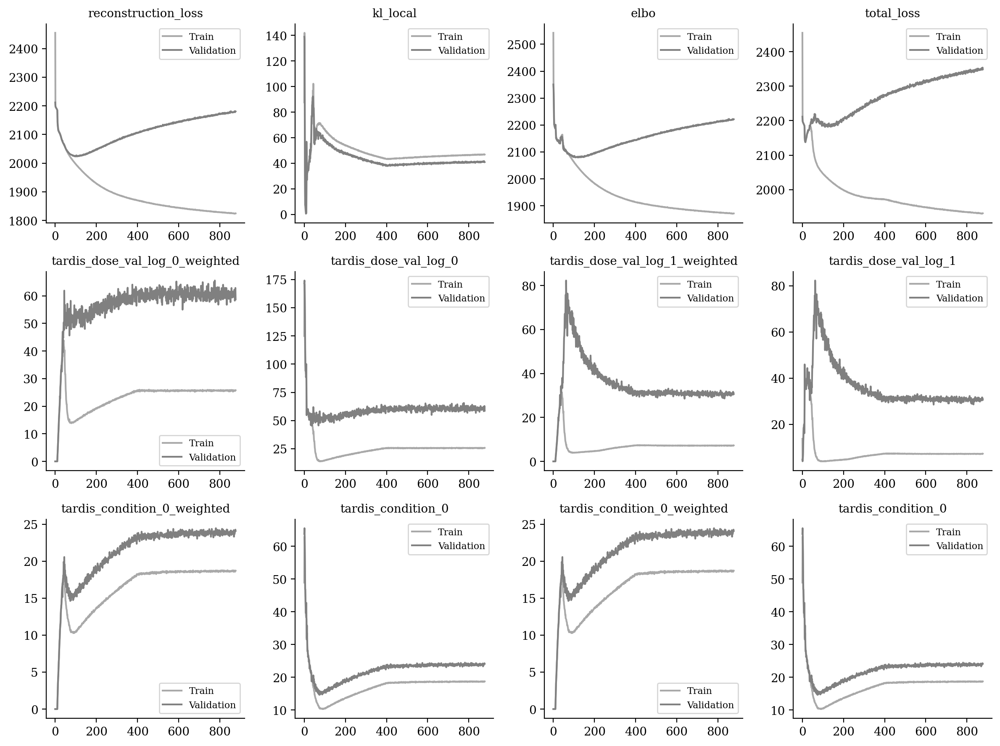

In [16]:
vae.plot_training_history(
    ignore_first=0, 
    n_col=4,
    metrics_name=[
        "reconstruction_loss", "kl_local", "elbo", "total_loss",
        #
        "tardis_dose_val_log_0_weighted", 
        "tardis_dose_val_log_0",
        "tardis_dose_val_log_1_weighted", 
        "tardis_dose_val_log_1",
        #
        "tardis_condition_0_weighted", 
        "tardis_condition_0",
        "tardis_condition_0_weighted", 
        "tardis_condition_0",
    ]
)

In [17]:
# from tardis._disentanglementmanager import DisentanglementManager
# display(np.array(DisentanglementManager.configurations.get_by_obs_key("age").reserved_latent_indices))
# display(np.array(DisentanglementManager.configurations.get_by_obs_key("sex").reserved_latent_indices))

In [18]:
# vae.plot_latent_kde(
#     adata_obs=adata.obs,
#     target_obs_key="sex",
#     latent_representation=vae.get_latent_representation(),
#     latent_dim_of_interest=None
# )

# Metrics

In [19]:
batch_size_vae_metrics = 512
vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    # "r2_train_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_20": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=20, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
    # "r2_validation_deg_50": vae.get_reconstruction_r2(top_n_differentially_expressed_genes=50, batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -1880.0659813652017
elbo -1926.0865478515625
r2_train 0.9989828870254721
r2_validation 0.9984383461264804


# Visualization

In [20]:
def prepare(ad_latent):
    sc.pp.neighbors(ad_latent, n_neighbors = 30)
    sc.tl.umap(ad_latent)
    sc.tl.diffmap(adata=ad_latent)
    root_age = ad_latent.obs["dose_val_log"].min()
    ad_latent.uns['iroot'] = np.flatnonzero(ad_latent.obs['dose_val_log'] == root_age)[0]
    sc.tl.dpt(ad_latent)

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
prepare(latent)
latent

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99710035 0.9963963  0.99477905 0.99360055 0.9929988
     0.98978174 0.9895368  0.98824376 0.9864194  0.985539   0.9837047
     0.982265   0.98051935 0.98017484]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


AnnData object with n_obs × n_vars = 14811 × 36
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_val_log', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

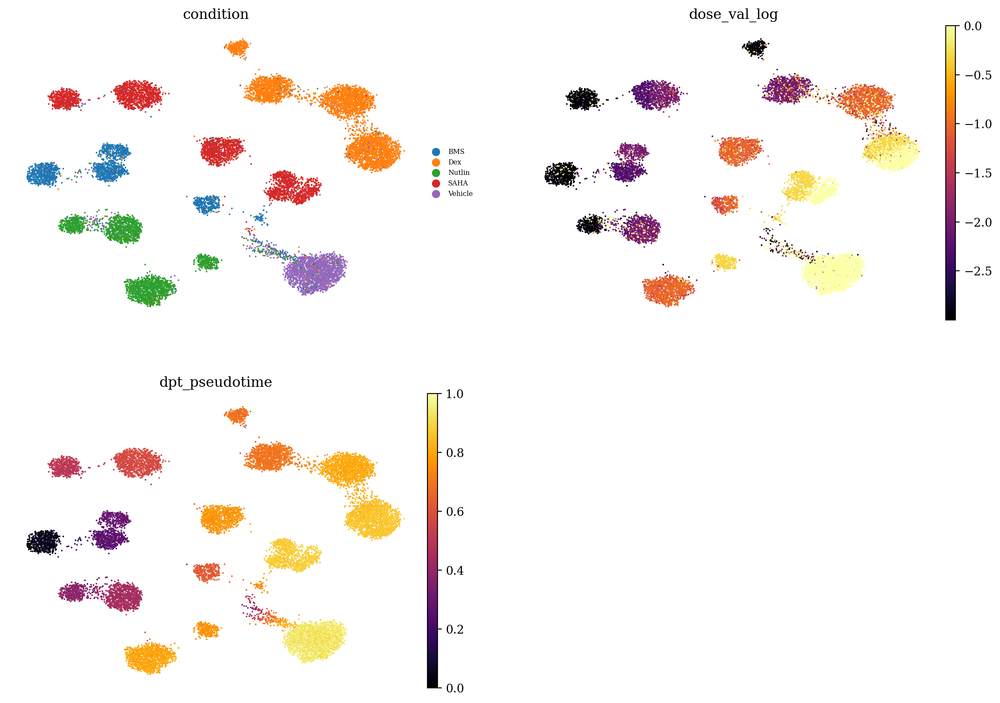

In [22]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        color_map="inferno",
        legend_fontsize="xx-small"
    )

In [23]:
del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9977665  0.99353004 0.9896494  0.92634994 0.9232589
     0.91944295 0.9155249  0.91325176 0.9125477  0.9111779  0.9085943
     0.90670896 0.9046983  0.9043433 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 28)

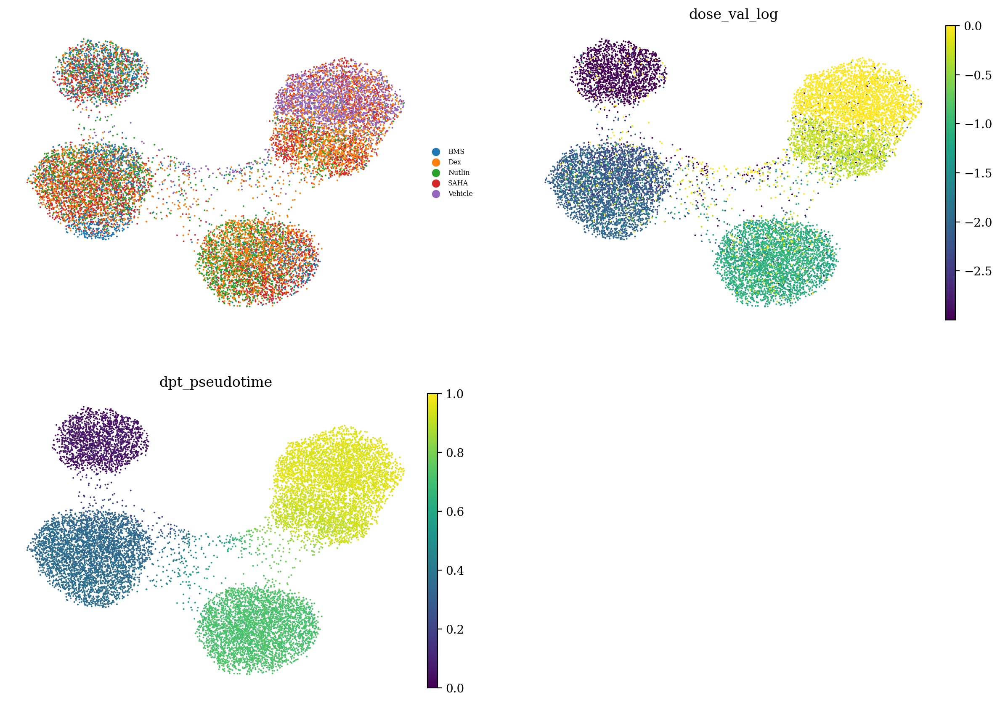

In [26]:
from tardis._disentanglementmanager import DisentanglementManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99724126 0.99592793 0.99095    0.99066037 0.9067406
     0.9039833  0.9038304  0.89563    0.89081293 0.88657814 0.88555217
     0.88240343 0.8784246  0.87756425]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 28)

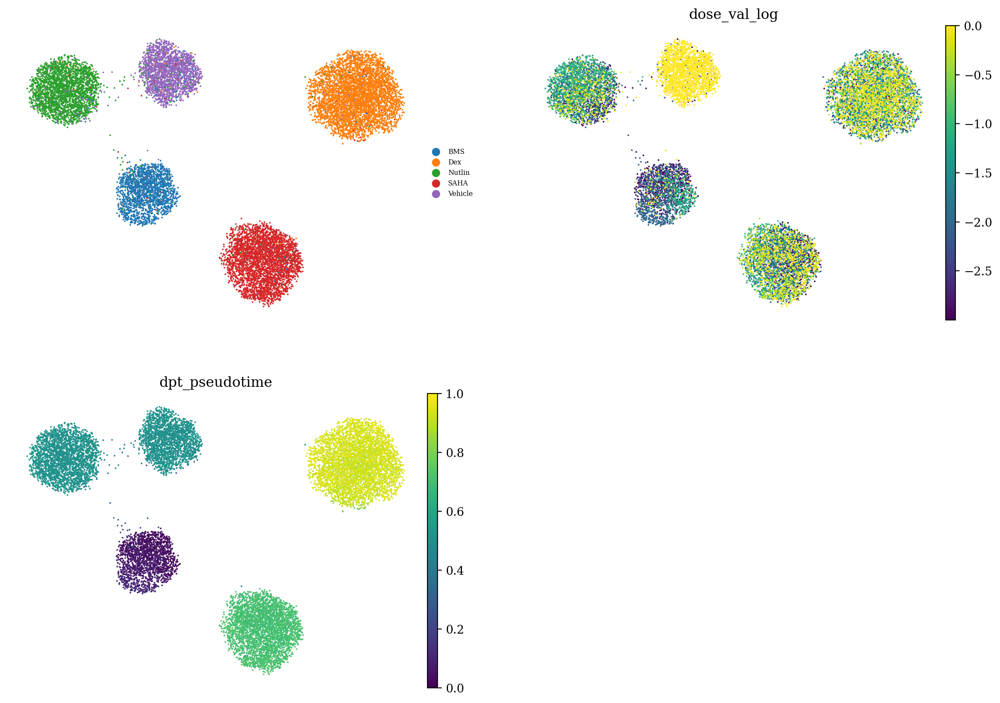

In [27]:
from tardis._disentanglementmanager import DisentanglementManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_val_log").unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.96763986 0.96542275 0.9632441  0.96110624 0.9603903
     0.93039876 0.92472047 0.9225699  0.9214224  0.91866064 0.9172461
     0.916311   0.9149183  0.91444886]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 20)

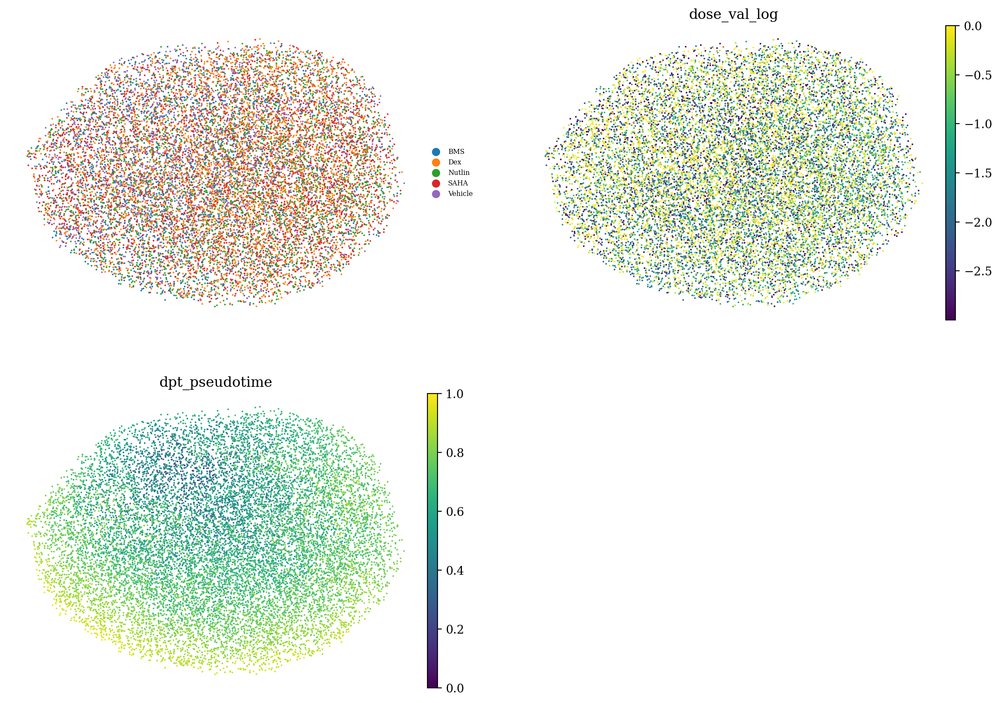

In [28]:
from tardis._disentanglementmanager import DisentanglementManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.unreserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.99973375 0.9993814  0.9989336  0.997122   0.99479955
     0.9939571  0.99305445 0.9923677  0.9895003  0.9886103  0.98726344
     0.98665947 0.9865872  0.9841573 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 8)

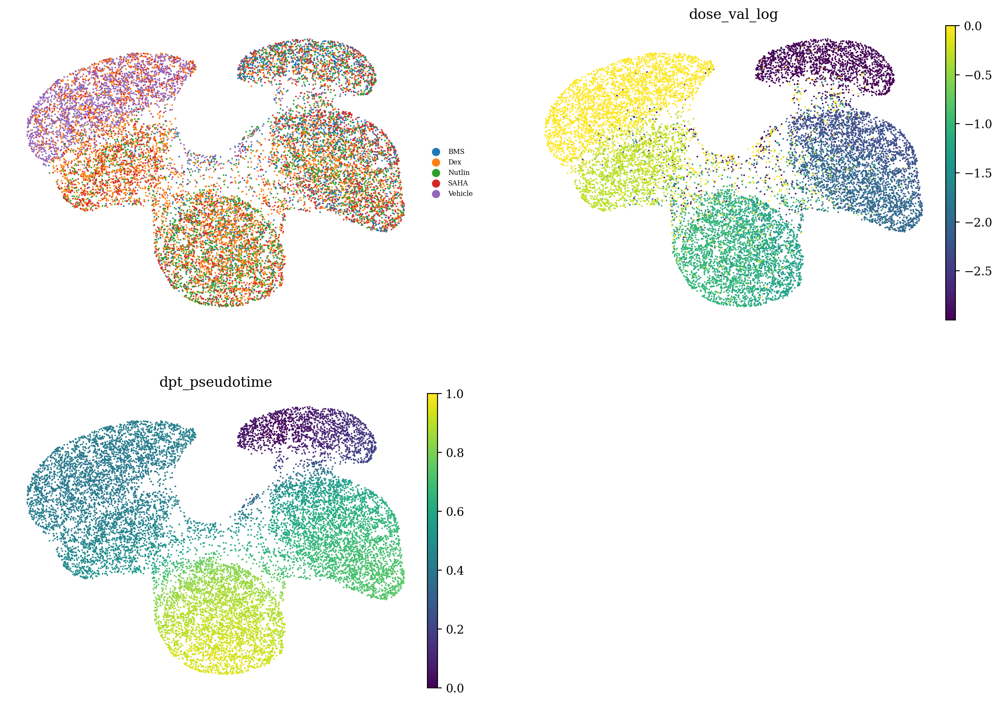

In [29]:
from tardis._disentanglementmanager import DisentanglementManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_val_log").reserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9984401  0.9977383  0.99606365 0.9959708  0.9532393
     0.94114757 0.9385107  0.93621415 0.9338407  0.93301785 0.9301341
     0.9295609  0.9285736  0.92460996]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


(14811, 8)

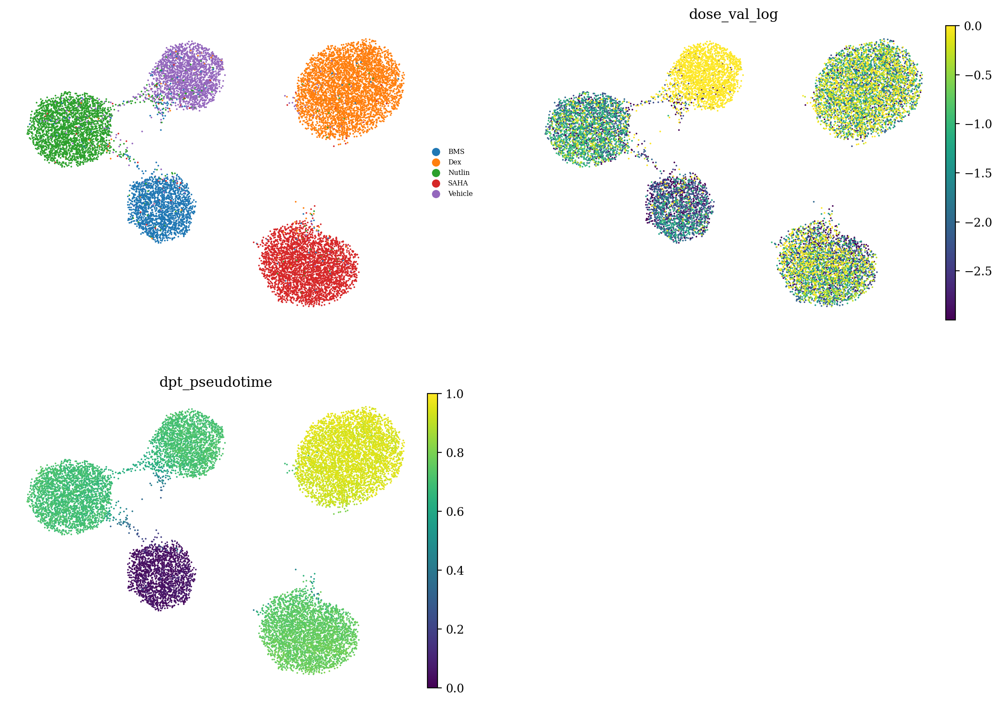

In [30]:
from tardis._disentanglementmanager import DisentanglementManager
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
prepare(latent)
display(latent.shape)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=["condition", "dose_val_log", "dpt_pseudotime"], 
        ncols=2,
        frameon=False,
        title="",
        legend_fontsize="xx-small"
    )

del latent
gc.collect();

# condition types

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


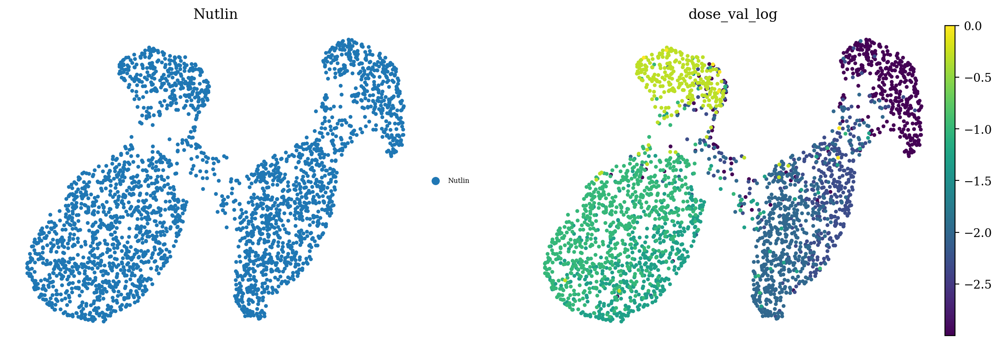

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


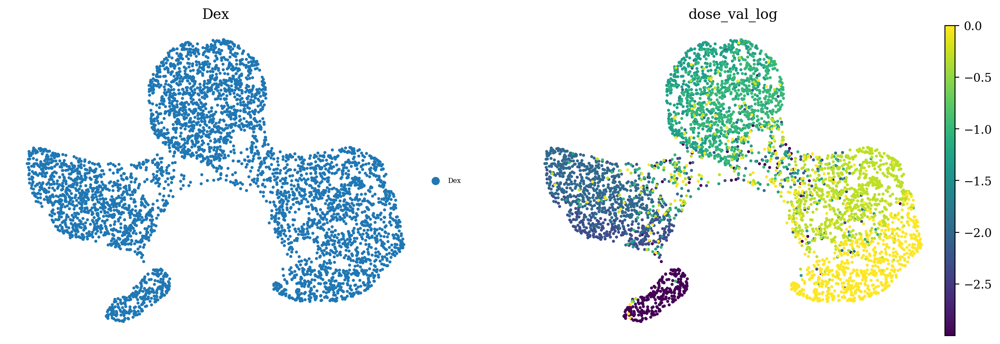

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


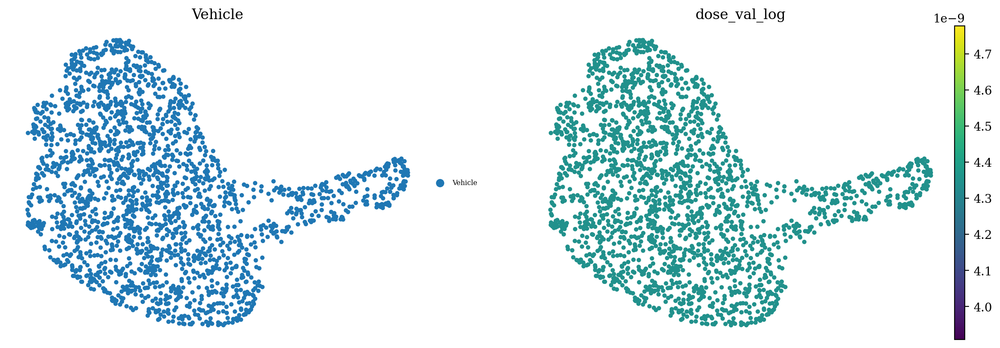

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


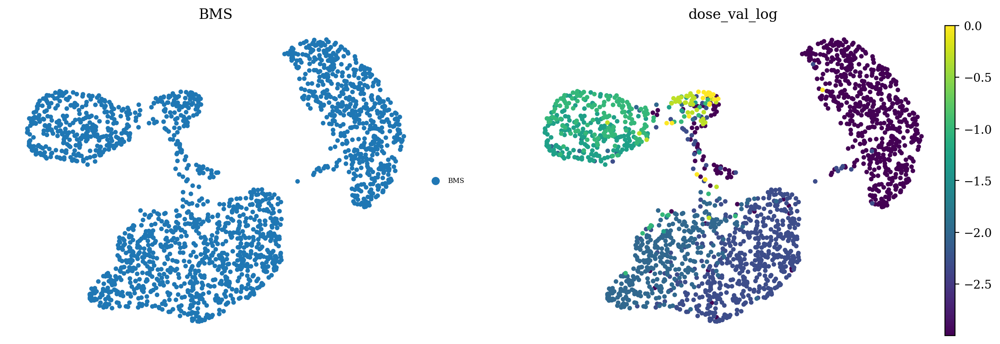

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


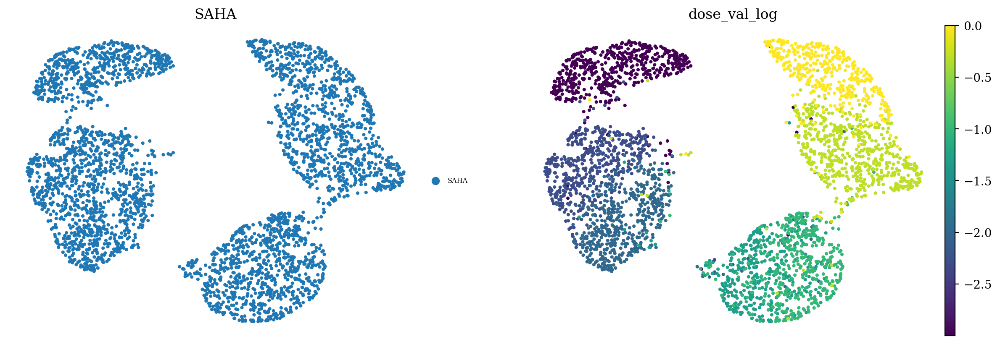

In [37]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_val_log").reserved_latent_indices], obs=adata.obs.copy())
for cell_type in latent.obs["condition"].unique():
    _latent = latent[latent.obs["condition"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["condition", "dose_val_log"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();

del latent
gc.collect();

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


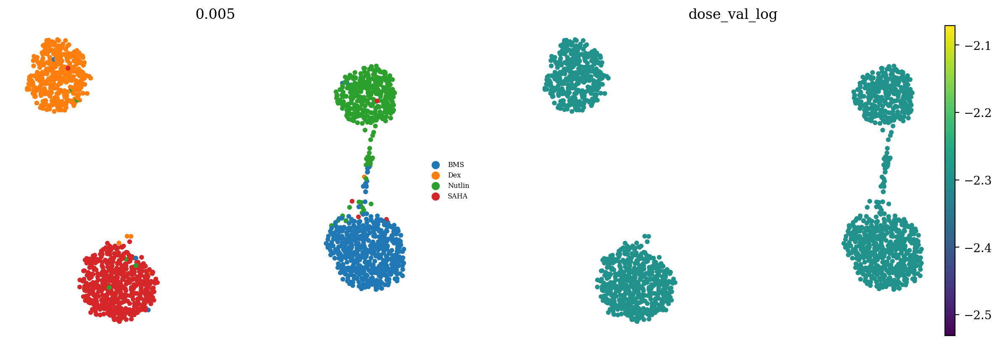

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


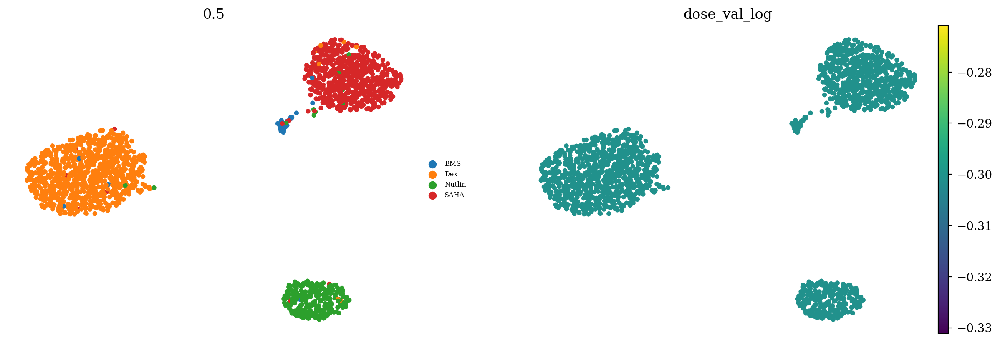

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)


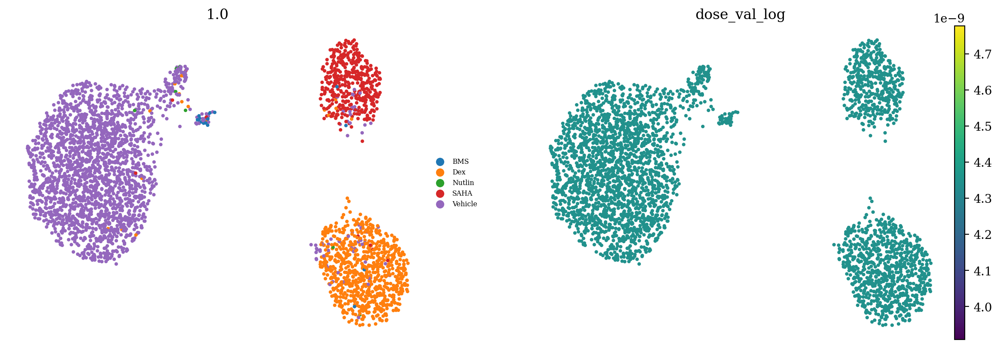

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


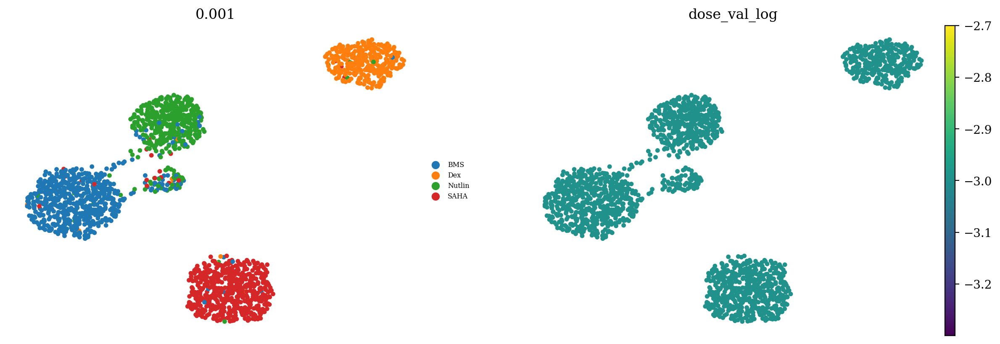

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


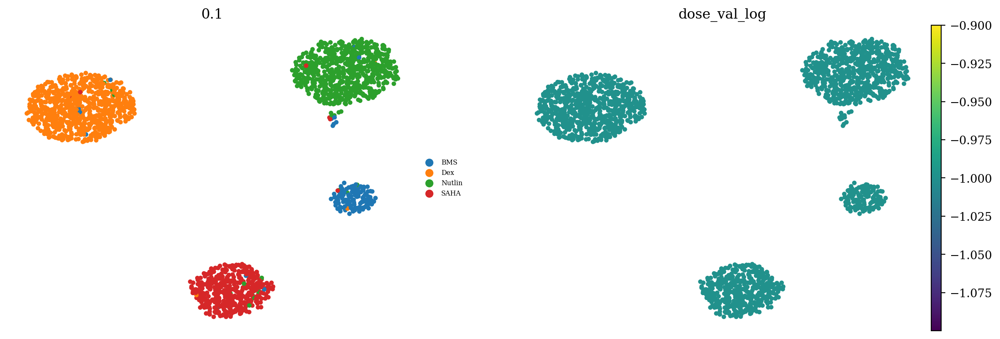

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)


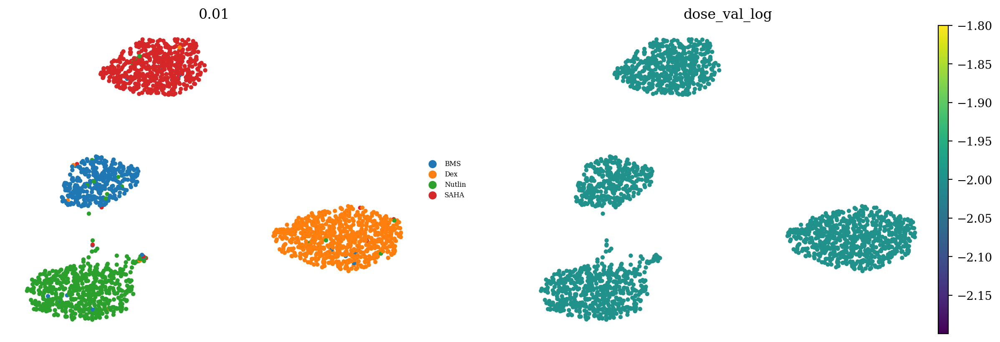

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


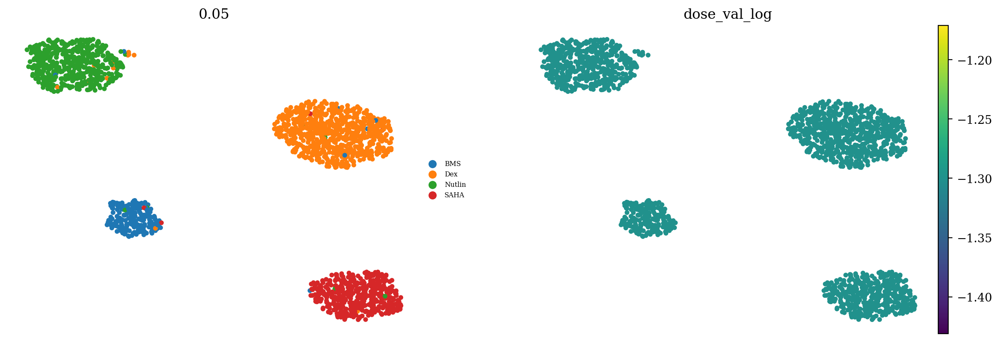

In [42]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
latent.obs["dose_val_str"] = latent.obs["dose_val"].astype(str)
for cell_type in latent.obs["dose_val_str"].unique():
    _latent = latent[latent.obs["dose_val_str"] == cell_type].copy()
    sc.pp.neighbors(_latent, n_neighbors = 30)
    sc.tl.umap(_latent)
    
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        sc.pl.umap(
            _latent, 
            color=["condition", "dose_val_log"], 
            ncols=3,
            frameon=False,
            title=cell_type,
            legend_fontsize="xx-small"
        )
    del _latent
    gc.collect();

del latent
gc.collect();